# Critical Role

In [101]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
from nltk.corpus import stopwords
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from scipy import interp
from itertools import cycle
from sklearn.preprocessing import label_binarize
from wordcloud import WordCloud
from nltk.tokenize import WordPunctTokenizer

In [102]:
TARGET_VARIABLE = 'SKILL'
TEXT_VARIABLE = 'BACKWARD_TEXT'

In [103]:
df_critical_role = pd.read_csv('https://raw.githubusercontent.com/amiapmorais/datasets/master/critical_role/skills_dataset.txt', sep=';', error_bad_lines=False)
df_critical_role.head(10)

b'Skipping line 9: expected 3 fields, saw 4\nSkipping line 197: expected 3 fields, saw 4\nSkipping line 201: expected 3 fields, saw 4\nSkipping line 202: expected 3 fields, saw 4\nSkipping line 248: expected 3 fields, saw 4\nSkipping line 269: expected 3 fields, saw 4\nSkipping line 299: expected 3 fields, saw 4\nSkipping line 346: expected 3 fields, saw 4\nSkipping line 355: expected 3 fields, saw 4\nSkipping line 356: expected 3 fields, saw 4\nSkipping line 399: expected 3 fields, saw 4\nSkipping line 401: expected 3 fields, saw 4\nSkipping line 402: expected 3 fields, saw 5\nSkipping line 403: expected 3 fields, saw 4\nSkipping line 405: expected 3 fields, saw 4\nSkipping line 422: expected 3 fields, saw 4\nSkipping line 423: expected 3 fields, saw 4\nSkipping line 449: expected 3 fields, saw 4\nSkipping line 454: expected 3 fields, saw 4\nSkipping line 479: expected 3 fields, saw 4\nSkipping line 488: expected 3 fields, saw 4\nSkipping line 491: expected 3 fields, saw 4\nSkipping l

,skill,check_line,backward_text
0,Nature,"MATT: Make a nature check for me, if you don't",She looks back from the inside and goes-- He t...
1,Nature,"TALIESIN: Nature check, oh no.",Error 404! The lip quiver. (laughter) She look...
2,Nature,TALIESIN: My nature check weirdly sucks.,"(laughter) She looks back and goes, ""There's a..."
3,Persuasion,MATT: Make a persuasion check.,"I'll help Beau! Yeah, I know, it's funny how m..."
4,Perception,MATT: Sure. Make a perception check at first.,cool! That's old business. We've seen that one...
5,Investigation,MATT: Okay. Then make an investigation check.,"one. As you guys take a short rest, you can us..."
6,Investigation,MATT: Make an investigation check.,Careful as you head out there. You don't know ...
7,Perception,MATT: Make a perception check.,"You glance and look inside, and you appear to ..."
8,Perception,perception check.,"and died. I have the second and the third, but..."
9,Investigation,MATT: Make an investigation check.,"temple somewhere, with another person with dre..."


In [104]:
df_critical_role.sample().values[0]

array(['Acrobatics', 'TALIESIN: Acrobatics check? Come on. Oh yeah! 28!',
       "Okay, so I wouldn't try and dodge? I don't get a dodge for any of that? Not if you're adhering to it and it collapses inward. Oh, I mean, I didn't know the situation. I was just trying to be safe. Okay. It's falling back and then crumbling inwards. Oh yeah, no, no, no. Make an acrobatics check. Okay, sorry, yeah. I thought it was like surfing. You were for a moment, and then it all collapsed."],
      dtype=object)

In [105]:
grafico_label = go.Figure()
grafico_label.add_trace(go.Histogram(histfunc="count",  x=df_critical_role['skill'].sort_values()))
grafico_label

# Tavern Keeper

In [106]:
df_tavern_keeper = pd.read_csv('https://raw.githubusercontent.com/amiapmorais/datasets/master/tavern_keeper/skills_dataset.csv')
df_tavern_keeper.head(10)

,skill,backward_text,original_name
0,History,"nodded accepting the parcel by ’s hands, in me...",Lore
1,Performance,"nodded accepting the parcel by ’s hands, in me...",Song
2,Medicine,(Healing roll: to see if he can remember anyth...,Healing
3,Performance,"Walking along the path with his companions, st...",Song
4,Survival,(rolls Explore to keep in character and sugges...,Expore
5,Deception,"(That would be Larsi)Larsi would see the well,...",Corruption
6,Survival,"(That would be Larsi)Larsi would see the well,...",Travel
7,Survival,"Still full of trepidation, will roll Explore f...",Explore
8,Perception,"Still full of trepidation, will roll Explore f...",awareness
9,Perception,"like it or not, we have stopped. Jot is on gua...",Awareness


In [107]:
grafico_label = go.Figure()
grafico_label.add_trace(go.Histogram(histfunc="count",  x=df_tavern_keeper['skill'].sort_values()))
grafico_label

In [108]:
# Filtrando o dataset apenas pelas skills 5e
skills = [
'Deception',
'Intimidation',
'Performance',
'Persuasion',
'Acrobatics',
'Sleight of Hand',
'Stealth',
'Arcana',
'History',
'Investigation',
'Nature',
'Religion',
'Athletics',
'Animal Handling',
'Insight',
'Medicine',
'Perception',
'Survival'
]

df_tavern_keeper_5e = df_tavern_keeper[df_tavern_keeper['skill'].isin(skills)].copy()

In [109]:
grafico_label = go.Figure()
grafico_label.add_trace(go.Histogram(histfunc="count",  x=df_tavern_keeper_5e['skill'].sort_values()))
grafico_label

# Data Frame da planilha de testes de perícia

In [110]:
df_skill_sheet = pd.read_csv('https://raw.githubusercontent.com/amiapmorais/datasets/master/skill_db.csv')
df_skill_sheet.head()

,skill,check_line,backward_text
0,Acrobatics,NaN,Freeing yourself from grapples and the like
1,Acrobatics,NaN,Squeezing through tight spaces without losing ...
2,Acrobatics,NaN,Balancing on thin/fragile surfaces without fal...
3,Acrobatics,NaN,Landing on your feet after a fall
4,Acrobatics,NaN,"Ignoring falling damage, such as falling from ..."


# Juntando os data frames

In [111]:
# Seleciona origem do treinamento
df_critical_role['origin'] = 'CR'
df_tavern_keeper_5e['origin'] = 'TK'
df_skill_sheet['origin'] = 'SS'

# Juntando em um unico data frame
list_df = [df_critical_role, df_skill_sheet]
df = pd.DataFrame(columns=['skill', 'check_line', 'backward_text', 'origin'])
df = df.append(list_df, ignore_index=True)

In [112]:
df.head()

,skill,check_line,backward_text,origin
0,Nature,"MATT: Make a nature check for me, if you don't",She looks back from the inside and goes-- He t...,CR
1,Nature,"TALIESIN: Nature check, oh no.",Error 404! The lip quiver. (laughter) She look...,CR
2,Nature,TALIESIN: My nature check weirdly sucks.,"(laughter) She looks back and goes, ""There's a...",CR
3,Persuasion,MATT: Make a persuasion check.,"I'll help Beau! Yeah, I know, it's funny how m...",CR
4,Perception,MATT: Sure. Make a perception check at first.,cool! That's old business. We've seen that one...,CR


In [113]:
df.shape

(5317, 4)

In [114]:
grafico_label = go.Figure()
grafico_label.add_trace(go.Histogram(histfunc="count",  x=df['skill'].sort_values()))
grafico_label

## Padronizando Etiquetas

In [115]:
df.columns = map(lambda x: str(x).upper(), df.columns)
df[TARGET_VARIABLE] = df[TARGET_VARIABLE].apply(lambda x: str(x).upper())

df.head()

,SKILL,CHECK_LINE,BACKWARD_TEXT,ORIGIN
0,NATURE,"MATT: Make a nature check for me, if you don't",She looks back from the inside and goes-- He t...,CR
1,NATURE,"TALIESIN: Nature check, oh no.",Error 404! The lip quiver. (laughter) She look...,CR
2,NATURE,TALIESIN: My nature check weirdly sucks.,"(laughter) She looks back and goes, ""There's a...",CR
3,PERSUASION,MATT: Make a persuasion check.,"I'll help Beau! Yeah, I know, it's funny how m...",CR
4,PERCEPTION,MATT: Sure. Make a perception check at first.,cool! That's old business. We've seen that one...,CR


# Limpando os dados

In [116]:
#!pip install -U pip setuptools wheel
#!pip install -U spacy

In [117]:
#!python -m spacy download en_core_web_sm

In [118]:
stopwords_set = set(STOP_WORDS)
stopwords_set

{"'d",
 "'ll",
 "'m",
 "'re",
 "'s",
 "'ve",
 'a',
 'about',
 'above',
 'across',
 'after',
 'afterwards',
 'again',
 'against',
 'all',
 'almost',
 'alone',
 'along',
 'already',
 'also',
 'although',
 'always',
 'am',
 'among',
 'amongst',
 'amount',
 'an',
 'and',
 'another',
 'any',
 'anyhow',
 'anyone',
 'anything',
 'anyway',
 'anywhere',
 'are',
 'around',
 'as',
 'at',
 'back',
 'be',
 'became',
 'because',
 'become',
 'becomes',
 'becoming',
 'been',
 'before',
 'beforehand',
 'behind',
 'being',
 'below',
 'beside',
 'besides',
 'between',
 'beyond',
 'both',
 'bottom',
 'but',
 'by',
 'ca',
 'call',
 'can',
 'cannot',
 'could',
 'did',
 'do',
 'does',
 'doing',
 'done',
 'down',
 'due',
 'during',
 'each',
 'eight',
 'either',
 'eleven',
 'else',
 'elsewhere',
 'empty',
 'enough',
 'even',
 'ever',
 'every',
 'everyone',
 'everything',
 'everywhere',
 'except',
 'few',
 'fifteen',
 'fifty',
 'first',
 'five',
 'for',
 'former',
 'formerly',
 'forty',
 'four',
 'from',
 'fron

In [119]:
NLP_SPACY = spacy.load("en_core_web_sm")

In [120]:
''' Not all variables are being undestood as strings so we have to force it'''
preprocessed_text_data = df[TEXT_VARIABLE].to_list()
''' Create the pipeline 'sentencizer' component '''
sentencizer = NLP_SPACY.create_pipe('sentencizer')
try:
    ''' We then add the component to the pipeline if we hadn't done before '''
    NLP_SPACY.add_pipe(sentencizer, before='parser')
except ValueError:
    print("Pipe already present.")

print(NLP_SPACY.pipe_names)

tokenized_data = []
semantics_data = []
lemmatized_doc = []
normalized_doc = []
raw_doc = []
for row in tqdm(preprocessed_text_data):
    str_row = str(row)
    doc = NLP_SPACY(str_row)
    preprocessed_doc = [token for token in doc if not token.norm_ in stopwords_set]
    tokenized_data.append(preprocessed_doc)
    raw_doc.append(" ".join([word.text for word in preprocessed_doc]))
    lemmatized_doc.append(" ".join([word.lemma_ for word in preprocessed_doc]))
    normalized_doc.append(" ".join([word.norm_ for word in preprocessed_doc]))

df['RAW_DOC'] = raw_doc
df['NORMALIZED_DOC'] = normalized_doc
df['LEMMATIZED_DOC'] = lemmatized_doc

df.head()

  0%|          | 4/5317 [00:00<02:32, 34.95it/s]

Pipe already present.
['tok2vec', 'tagger', 'parser', 'ner', 'attribute_ruler', 'lemmatizer']


100%|██████████| 5317/5317 [02:19<00:00, 38.10it/s]


,SKILL,CHECK_LINE,BACKWARD_TEXT,ORIGIN,RAW_DOC,NORMALIZED_DOC,LEMMATIZED_DOC
0,NATURE,"MATT: Make a nature check for me, if you don't",She looks back from the inside and goes-- He t...,CR,looks inside goes-- tried ! Error 404 ! lip qu...,looks inside goes-- tried ! error 404 ! lip qu...,look inside goes-- try ! error 404 ! lip quive...
1,NATURE,"TALIESIN: Nature check, oh no.",Error 404! The lip quiver. (laughter) She look...,CR,Error 404 ! lip quiver . ( laughter ) looks go...,error 404 ! lip quiver . ( laughter ) looks go...,error 404 ! lip quiver . ( laughter ) look go ...
2,NATURE,TALIESIN: My nature check weirdly sucks.,"(laughter) She looks back and goes, ""There's a...",CR,"( laughter ) looks goes , "" cluster seaweed in...","( laughter ) looks goes , "" cluster seaweed in...","( laughter ) look go , "" cluster seaweed insid..."
3,PERSUASION,MATT: Make a persuasion check.,"I'll help Beau! Yeah, I know, it's funny how m...",CR,"help Beau ! Yeah , know , funny nature check t...","help beau ! yeah , know , funny nature check t...","help Beau ! yeah , know , funny nature check t..."
4,PERCEPTION,MATT: Sure. Make a perception check at first.,cool! That's old business. We've seen that one...,CR,"cool ! old business . seen . guys short rest ,...","cool ! old business . seen . guys short rest ,...","cool ! old business . see . guy short rest , u..."


In [121]:
plot_term_scatter(populous_df,'BACKWARD_TEXT')


,words,count,pos
0,.,30699,PUNCT
1,",",19653,PUNCT
2,',14946,PUNCT
3,the,13749,DET
4,I,10657,PRON
...,...,...,...
95,guys,801,NOUN
96,So,791,ADV
97,Can,785,AUX
98,over,725,ADP


In [122]:
plot_term_scatter(populous_df,'LEMMATIZED_DOC')

,words,count,pos
0,.,31831,PUNCT
1,",",19716,PUNCT
2,?,7795,PUNCT
3,"""",3578,PUNCT
4,!,2607,PUNCT
...,...,...,...
95,attack,221,NOUN
96,forward,221,ADV
97,step,220,NOUN
98,move,220,VERB


In [123]:
entities_obs = []
for doc in tokenized_data:
    for token in doc:
        if token.ent_type_:
            entities_obs.append((token.norm_, token.ent_type_))

entities_df = pd.DataFrame(entities_obs, columns=['entity_text', 'entity_type'])
entities_df['id'] = entities_df.index
grouped_entities_df = (entities_df.groupby(['entity_text', 'entity_type']).count()
                                                                         .reset_index()
                                                                         .rename(columns={'id': 'count'})
                                                                         .sort_values('count', ascending=False)
                                                                         .head(100))

fig = px.treemap(grouped_entities_df, 
                 path=['entity_type', 'entity_text'], 
                 values='count', 
                 title='Top-50 entities present in text grouped by type')
fig.show()
entity_type_df = grouped_entities_df['entity_type'].value_counts().reset_index()

fig = px.pie(entity_type_df, values='entity_type', names='index', title='Entity type frequency')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [124]:
processed_tokenized_data = []
processed_doc_text = []
entities_obs = []
entity_unwanted_types = set(['PERSON', 'ORG', 'DATE', 'CARDINAL', 'ORDINAL', 'TIME', "GPE", "QUANTITY"])

for doc in tokenized_data:
    entities_text = ""
    processed_doc = []
    for token in doc:
        if not token.ent_type_:
            processed_doc.append(token)
        elif not token.ent_type_ in entity_unwanted_types:
            processed_doc.append(token)
            entities_obs.append((token.norm_, token.ent_type_))

    processed_tokenized_data.append(processed_doc)
    processed_doc_text.append(" ".join([word.norm_ for word in processed_doc ]))

''' Processing text on entity level'''
df['PROCESSED_DOC'] = processed_doc_text
df.head()

,SKILL,CHECK_LINE,BACKWARD_TEXT,ORIGIN,RAW_DOC,NORMALIZED_DOC,LEMMATIZED_DOC,PROCESSED_DOC
0,NATURE,"MATT: Make a nature check for me, if you don't",She looks back from the inside and goes-- He t...,CR,looks inside goes-- tried ! Error 404 ! lip qu...,looks inside goes-- tried ! error 404 ! lip qu...,look inside goes-- try ! error 404 ! lip quive...,looks inside goes-- tried ! error 404 ! lip qu...
1,NATURE,"TALIESIN: Nature check, oh no.",Error 404! The lip quiver. (laughter) She look...,CR,Error 404 ! lip quiver . ( laughter ) looks go...,error 404 ! lip quiver . ( laughter ) looks go...,error 404 ! lip quiver . ( laughter ) look go ...,error 404 ! lip quiver . ( laughter ) looks go...
2,NATURE,TALIESIN: My nature check weirdly sucks.,"(laughter) She looks back and goes, ""There's a...",CR,"( laughter ) looks goes , "" cluster seaweed in...","( laughter ) looks goes , "" cluster seaweed in...","( laughter ) look go , "" cluster seaweed insid...","( laughter ) looks goes , "" cluster seaweed in..."
3,PERSUASION,MATT: Make a persuasion check.,"I'll help Beau! Yeah, I know, it's funny how m...",CR,"help Beau ! Yeah , know , funny nature check t...","help beau ! yeah , know , funny nature check t...","help Beau ! yeah , know , funny nature check t...","help ! yeah , know , funny nature check terrib..."
4,PERCEPTION,MATT: Sure. Make a perception check at first.,cool! That's old business. We've seen that one...,CR,"cool ! old business . seen . guys short rest ,...","cool ! old business . seen . guys short rest ,...","cool ! old business . see . guy short rest , u...","cool ! old business . seen . guys short rest ,..."


In [125]:
entities_df = pd.DataFrame(entities_obs, columns=['entity_text', 'entity_type'])
entities_df['id'] = entities_df.index
grouped_entities_df = (entities_df.groupby(['entity_text', 'entity_type']).count()
                                                                         .reset_index()
                                                                         .rename(columns={'id': 'count'})
                                                                         .sort_values('count', ascending=False)
                                                                         .head(100))
fig = px.treemap(grouped_entities_df, 
                 path=['entity_type', 'entity_text'], 
                 values='count', 
                 title='Top-50 entities present in text grouped by type after filtering')
fig.show()

entity_type_df = grouped_entities_df['entity_type'].value_counts().reset_index()
fig = px.pie(entity_type_df, values='entity_type', names='index', title='Entity type frequency after filtering')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [126]:
token_obs = []
for doc in processed_tokenized_data:
    for token in doc:
        token_obs.append((token.norm_, token.pos_))

token_df = pd.DataFrame(token_obs)
token_df.columns = ['token', 'pos']
token_df['id'] = token_df.index

''' Plotting token grouped by POS treemap '''
grouped_token_df = (token_df.groupby(['token', 'pos']).count()
                                                     .reset_index()
                                                     .rename(columns={'id': 'count'})
                                                     .sort_values('count', ascending=False)
                                                     .head(100))

fig = px.treemap(grouped_token_df, 
                 path=['pos', 'token'], 
                 values='count', 
                 title='Top-100 tokens present in text grouped by Part-of-Speech')
fig.show()

''' Plotting POS bar chart '''
pos_df = token_df.groupby('pos').count().reset_index().rename(columns={'token':'count'})

fig = px.bar(pos_df, x='pos', y='count', text='count', title="Part-of-Speech type frequency")
fig.update_layout(xaxis_categoryorder = 'total descending')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()

In [146]:
allowed_pos_set = set(["PROPN", "NOUN", "ADV", "ADJ", "VERB"])

processed_doc = []
filtered_token_obs = []
for doc in processed_tokenized_data:
    doc_tokens = [word for word in doc if str(word.pos_) in allowed_pos_set]
    filtered_token_obs.append(doc_tokens)
    processed_doc.append(" ".join(token.norm_ for token in doc_tokens))

df['PROCESSED_DOC'] = processed_doc
df['TOKENS'] = filtered_token_obs
df.head()

,SKILL,CHECK_LINE,BACKWARD_TEXT,ORIGIN,RAW_DOC,NORMALIZED_DOC,LEMMATIZED_DOC,PROCESSED_DOC,TOKENS
0,NATURE,"MATT: Make a nature check for me, if you don't",She looks back from the inside and goes-- He t...,CR,looks inside goes-- tried ! Error 404 ! lip qu...,looks inside goes-- tried ! error 404 ! lip qu...,look inside goes-- try ! error 404 ! lip quive...,looks inside goes-- tried error lip quiver lau...,"[looks, inside, goes--, tried, Error, lip, qui..."
1,NATURE,"TALIESIN: Nature check, oh no.",Error 404! The lip quiver. (laughter) She look...,CR,Error 404 ! lip quiver . ( laughter ) looks go...,error 404 ! lip quiver . ( laughter ) looks go...,error 404 ! lip quiver . ( laughter ) look go ...,error lip quiver laughter looks goes cluster s...,"[Error, lip, quiver, laughter, looks, goes, cl..."
2,NATURE,TALIESIN: My nature check weirdly sucks.,"(laughter) She looks back and goes, ""There's a...",CR,"( laughter ) looks goes , "" cluster seaweed in...","( laughter ) looks goes , "" cluster seaweed in...","( laughter ) look go , "" cluster seaweed insid...",laughter looks goes cluster seaweed inside ste...,"[laughter, looks, goes, cluster, seaweed, insi..."
3,PERSUASION,MATT: Make a persuasion check.,"I'll help Beau! Yeah, I know, it's funny how m...",CR,"help Beau ! Yeah , know , funny nature check t...","help beau ! yeah , know , funny nature check t...","help Beau ! yeah , know , funny nature check t...",help know funny nature check terrible looking ...,"[help, know, funny, nature, check, terrible, L..."
4,PERCEPTION,MATT: Sure. Make a perception check at first.,cool! That's old business. We've seen that one...,CR,"cool ! old business . seen . guys short rest ,...","cool ! old business . seen . guys short rest ,...","cool ! old business . see . guy short rest , u...",cool old business seen guys short rest use hit...,"[cool, old, business, seen, guys, short, rest,..."


In [147]:
space_pattern = r'\s\s+'
df['PROCESSED_DOC'] = df['PROCESSED_DOC'].str.replace(space_pattern, " ").str.strip()
# Removing accents and symbols
df['PROCESSED_DOC'] = df['PROCESSED_DOC'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')

In [148]:
token_obs = []
for doc in filtered_token_obs:
    for token in doc:
        token_obs.append((token.norm_, token.pos_))

token_df = pd.DataFrame(token_obs)
token_df.columns = ['token', 'pos']
token_df['id'] = token_df.index

''' Plotting token grouped by POS treemap '''
grouped_token_df = (token_df.groupby(['token', 'pos']).count()
                                                     .reset_index()
                                                     .rename(columns={'id': 'count'})
                                                     .sort_values('count', ascending=False)
                                                     .head(100))

fig = px.treemap(grouped_token_df, 
                 path=['pos', 'token'], 
                 values='count', 
                 title='Top-100 tokens present in text grouped by Part-of-Speech after filtering')
fig.show()

''' Plotting POS bar chart '''
pos_df = token_df.groupby('pos').count().reset_index().rename(columns={'token':'count'})

fig = px.bar(pos_df, x='pos', y='count', text='count', title="Part-of-Speech type frequency after filtering")
fig.update_layout(xaxis_categoryorder = 'total descending')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()

In [130]:
df = df.drop(columns=['ORIGINAL_NAME', 'CHECK_LINE', 'ORIGIN'])
df.info()

KeyError: "['ORIGINAL_NAME'] not found in axis"

In [149]:
processed_data_df = df
print(processed_data_df.info())
processed_data_df = processed_data_df.drop(columns=['TOKENS']).dropna()
processed_data_df[TARGET_VARIABLE] = processed_data_df[TARGET_VARIABLE].apply(lambda x: str(x))
print(processed_data_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5317 entries, 0 to 5316
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   SKILL           5317 non-null   object
 1   CHECK_LINE      5098 non-null   object
 2   BACKWARD_TEXT   5316 non-null   object
 3   ORIGIN          5317 non-null   object
 4   RAW_DOC         5317 non-null   object
 5   NORMALIZED_DOC  5317 non-null   object
 6   LEMMATIZED_DOC  5317 non-null   object
 7   PROCESSED_DOC   5317 non-null   object
 8   TOKENS          5317 non-null   object
dtypes: object(9)
memory usage: 374.0+ KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 5097 entries, 0 to 5097
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   SKILL           5097 non-null   object
 1   CHECK_LINE      5097 non-null   object
 2   BACKWARD_TEXT   5097 non-null   object
 3   ORIGIN          5097 non-null   

In [150]:
labels_count = df[TARGET_VARIABLE].value_counts()
labels_count_mask = labels_count > 300
populous_labels = set(labels_count[labels_count_mask].index)

In [151]:
populous_mask = df[TARGET_VARIABLE].isin(populous_labels)
scarse_df = df[~populous_mask].copy()
populous_df = df[populous_mask].copy()

populous_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3793 entries, 3 to 5316
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   SKILL           3793 non-null   object
 1   CHECK_LINE      3718 non-null   object
 2   BACKWARD_TEXT   3792 non-null   object
 3   ORIGIN          3793 non-null   object
 4   RAW_DOC         3793 non-null   object
 5   NORMALIZED_DOC  3793 non-null   object
 6   LEMMATIZED_DOC  3793 non-null   object
 7   PROCESSED_DOC   3793 non-null   object
 8   TOKENS          3793 non-null   object
dtypes: object(9)
memory usage: 296.3+ KB


In [152]:
# Amostra estratificada com reposição >> Risco de viciar o modelo
df_estrat = populous_df.groupby(TARGET_VARIABLE).apply(pd.DataFrame.sample, n=300, replace=False).reset_index(drop=True)
df_estrat_scarce_partial = scarse_df.groupby(TARGET_VARIABLE).apply(pd.DataFrame.sample, n=300, replace=True).reset_index(drop=True)
df_estrat = df_estrat.append(df_estrat_scarce_partial)
# Descomentar quando a massa de dados tiver mais que 300 exemplos de cada skill
#df_estrat = df.groupby('skill').apply(pd.DataFrame.sample, n=300).reset_index(drop=True)

grafico_label = go.Figure()
grafico_label.add_trace(go.Histogram(histfunc="count",  x=df_estrat[TARGET_VARIABLE].sort_values()))
grafico_label.show()

In [153]:

grafico_label = go.Figure()
grafico_label.add_trace(go.Histogram(histfunc="count",  x=populous_df[TARGET_VARIABLE].sort_values()))
grafico_label.show()

grafico_label = go.Figure()
grafico_label.add_trace(go.Histogram(histfunc="count",  x=scarse_df[TARGET_VARIABLE].sort_values()))
grafico_label

# Treinando o modelo

In [155]:
is_gridsearching = False
if is_gridsearching:
    search_count_vectorizer = CountVectorizer()
    search_tfidf_transformer = TfidfTransformer()
    clf = LinearSVC()
    steps = [
        ('vect', search_count_vectorizer),
        ('tfidf', tfidf_transformer),
        ('clf', LinearSVC())]
    
    ''' Those are all the params values that will be tested.'''
    search_params = {
        'vect__min_df': np.arange(0, 0.001, 0.0003),
        'vect__max_df': np.arange(0.2, 0.9, 0.3),
        'vect__max_features': [None],
        'vect__ngram_range': [(1, 2), (1, 3), (2, 3)],
        'tfidf__norm': ['l2'],
        'tfidf__use_idf': [False, True],
        'tfidf__smooth_idf': [False],
        'tfidf__sublinear_tf' : [False, True],
        'clf__penalty': ['l1', 'l2'],
        'clf__dual' : [False, True],
        'clf__class_weight' : [None, 'balanced'],
    }
    
    search_pipeline = Pipeline(steps)

    gs = GridSearchCV(search_pipeline,
                      param_grid=search_params, cv=5)
    gs.fit(data_df['PROCESSED_DOC'].values, data_df[TARGET_VARIABLE])
    results = gs.cv_results_
    print(gs.best_params_)

print(count_vect.get_feature_names())

In [156]:
search_count_vectorizer = CountVectorizer(
    max_df = 0.3,
    max_features = None,
    min_df = 0.0,
    ngram_range = (1, 3)
)
search_tfidf_transformer = TfidfTransformer(
    norm = 'l2',
    smooth_idf = False,
    sublinear_tf = True,
    use_idf = True
)
clf = LinearSVC(dual = False, penalty = 'l1')
steps = [
    ('vect', search_count_vectorizer),
    ('tfidf', search_tfidf_transformer),
    ('clf', clf)]


search_pipeline = Pipeline(steps)

In [ ]:
f1_scores = cross_val_score(search_pipeline, df_estrat['PROCESSED_DOC'], df_estrat[TARGET_VARIABLE], cv=5, scoring='f1_micro')
f1_scores.mean()

/home/dev/anaconda3/envs/rpgai/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/home/dev/anaconda3/envs/rpgai/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



## Avaliando Modelos

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_estrat['PROCESSED_DOC'], df_estrat[TARGET_VARIABLE], random_state = 0)

In [ ]:
# Treinando o modelo
# pra treinar o modelo usa os 75% dos textos e dos labels, pra depois ele predizer
#clf = MultinomialNB().fit(X_train_tfidf, y_train)
%time clf = search_pipeline.fit(X_train, y_train)

In [ ]:
#aqui ele cria um array do que foi predito dos 25% de teste de treinamento que não foi usado pra treinar o modelo
y_pred = clf.predict(X_test)

In [ ]:

#Adicionando as ações da planilha a acuracia foi de 0.45254901960784316 para 0.47058823529411764
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

In [ ]:
#aqui ele pega a precisão de cara feature, porque ele compara a feature o acerto de cada feature ordenada do menor para o maior (em caso de números), ou ordem alfabética

print(metrics.classification_report(y_test, y_pred))

# Matriz de confusão

In [144]:
skill_arr = np.array(df_estrat[TARGET_VARIABLE].unique())
skill_arr = np.sort(skill_arr)

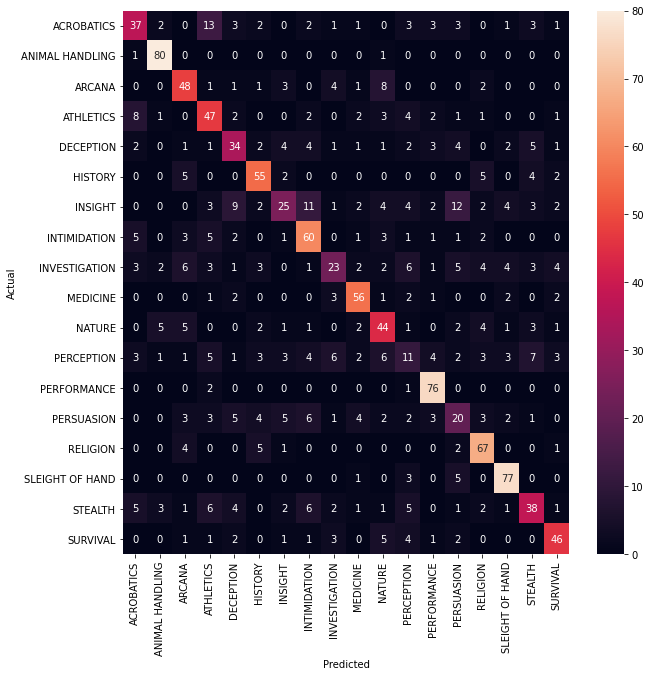

In [145]:

conf_mat = confusion_matrix(y_test, y_pred)
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=skill_arr, yticklabels=skill_arr)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [ ]:
y_test.value_counts()

## Curvas ROC

In [81]:
# Split dos dados em treino e validação
X_train, X_test, y_train, y_test = train_test_split(df_estrat['PROCESSED_DOC'], df_estrat[TARGET_VARIABLE], random_state = 0)

In [82]:
n_classes = df_estrat[TARGET_VARIABLE].nunique()
binary_targets = label_binarize(y_test, classes=df_estrat[TARGET_VARIABLE].unique())

In [83]:
search_pipeline = Pipeline(steps)

In [84]:
y_score = search_pipeline.fit(X_train, y_train).decision_function(X_test)

In [85]:
y_test = binary_targets

In [86]:
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

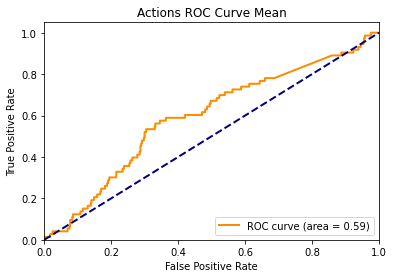

In [87]:
plt.figure()
lw = 2
plt.plot(fpr[2], tpr[2], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[2])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Actions ROC Curve Mean')
plt.legend(loc="lower right")
plt.show()

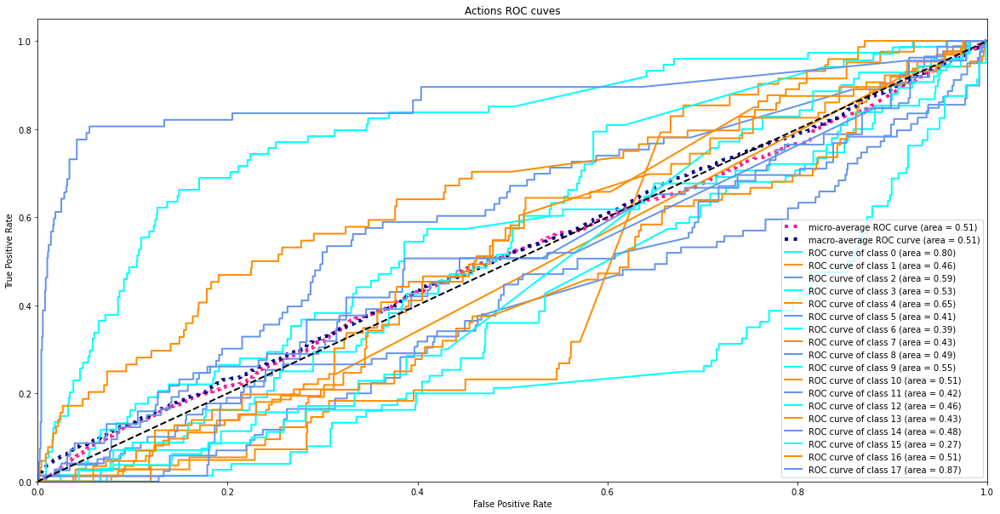

In [88]:

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure(figsize=(20,10))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Actions ROC cuves')
plt.legend(loc="lower right")
plt.show()

# Wordclouds + Term Scatter

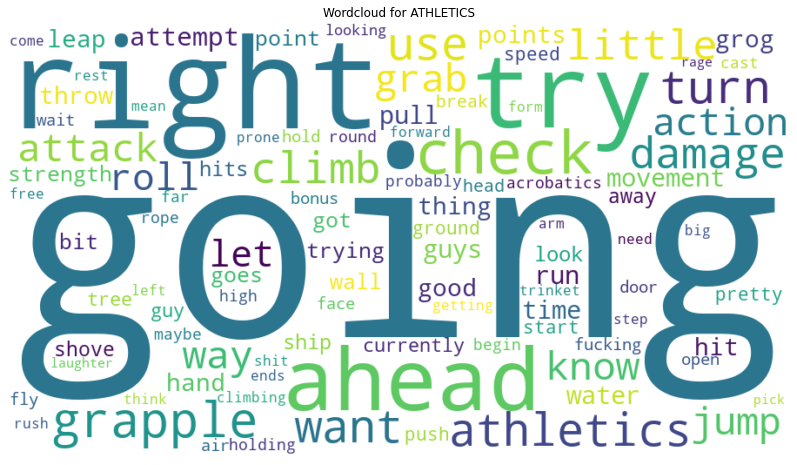

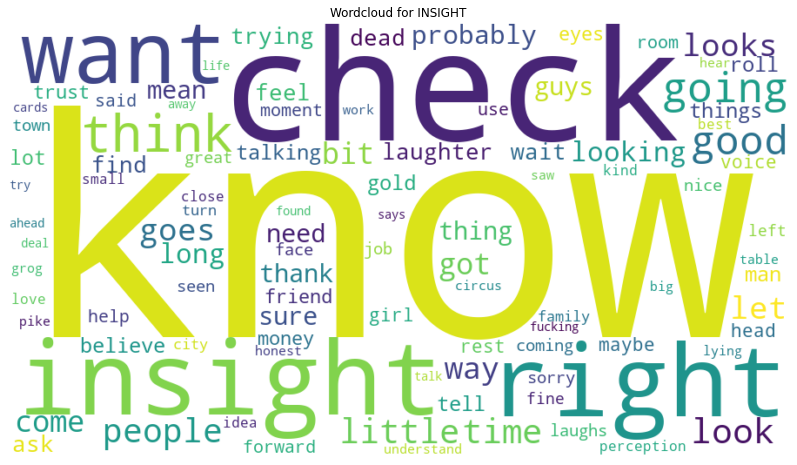

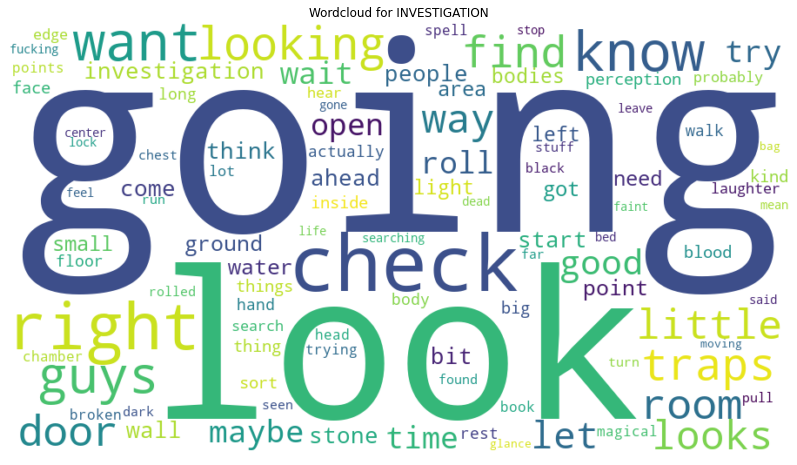

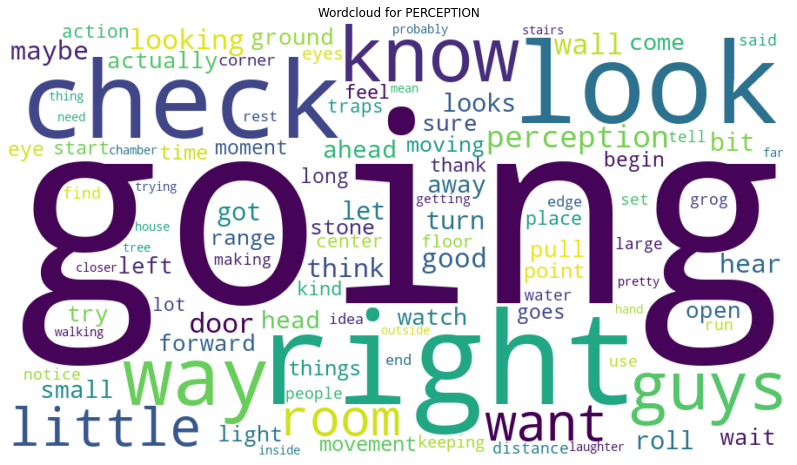

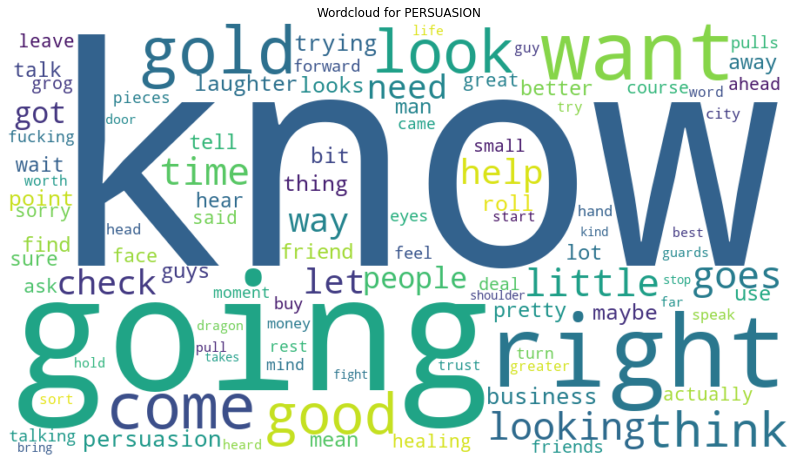

...

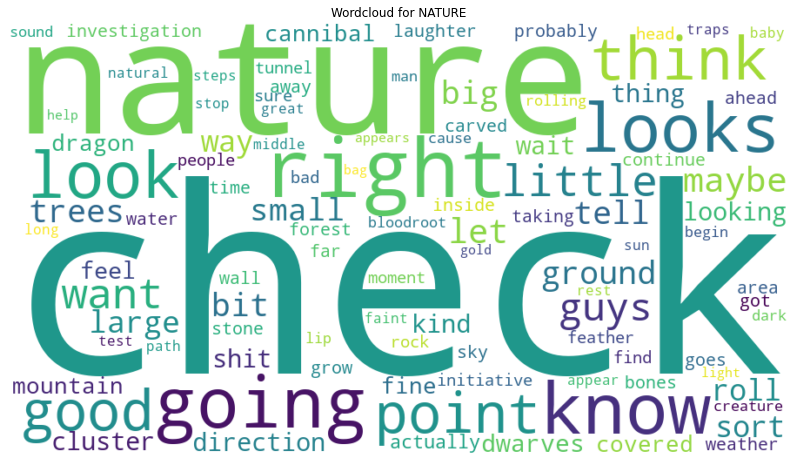

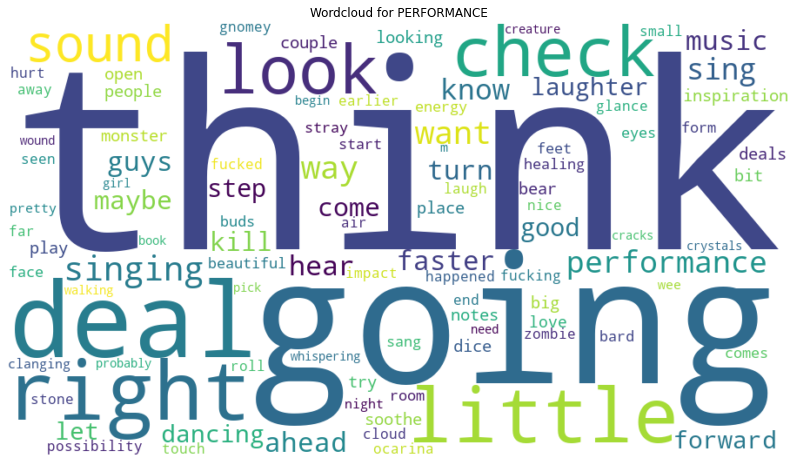

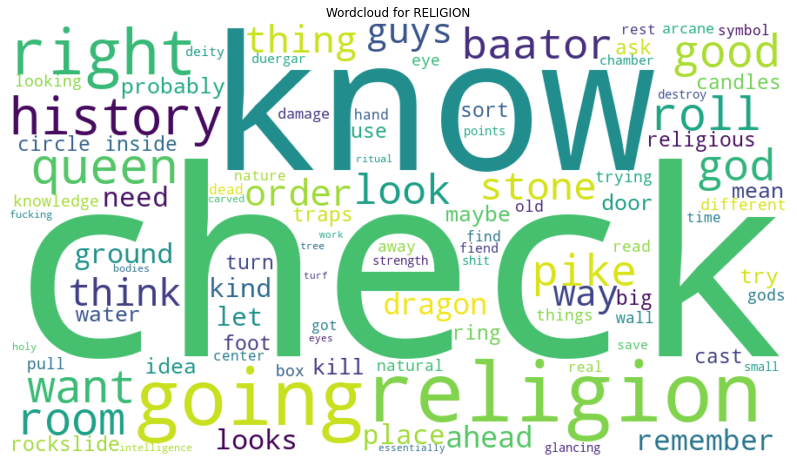

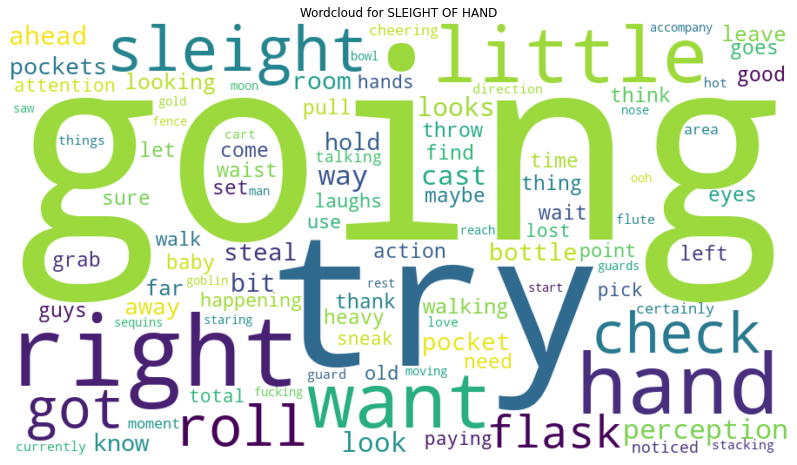

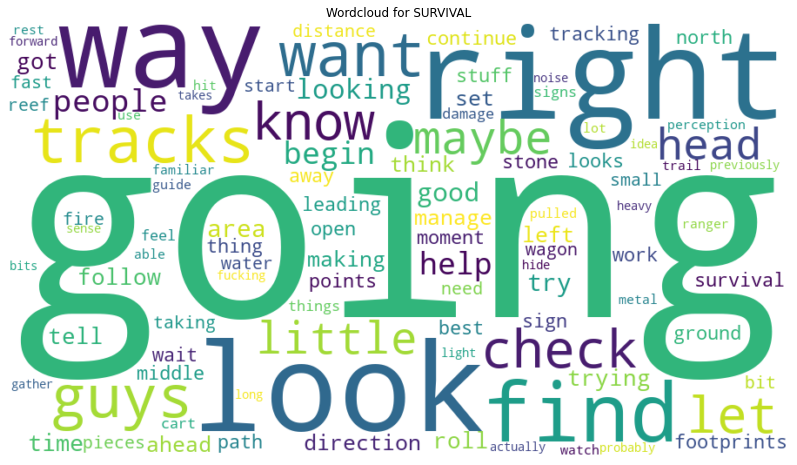

In [95]:
for label in df_estrat[TARGET_VARIABLE].unique():
    label_mask = df_estrat[TARGET_VARIABLE] == label
    partial_df = df_estrat[label_mask]
    plot_wordcloud(partial_df['PROCESSED_DOC'], title="Wordcloud for {}".format(label))
    plot_term_scatter(partial_df,'PROCESSED_DOC', title="Distribution of top-50 terms for {}".format(label))

NATURE


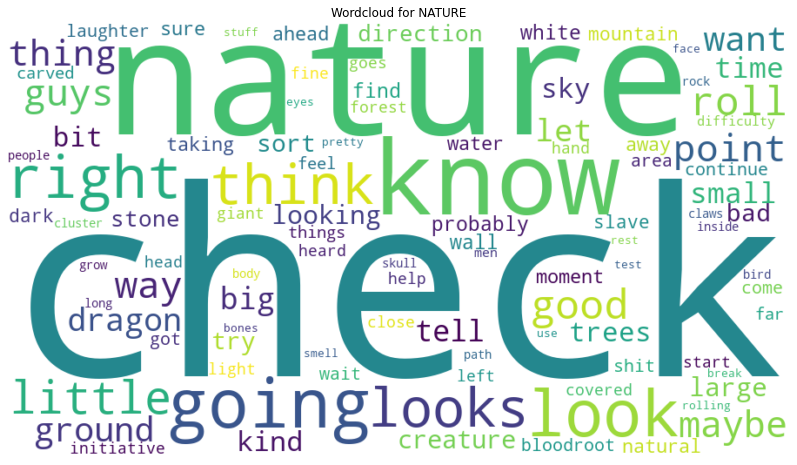

MEDICINE


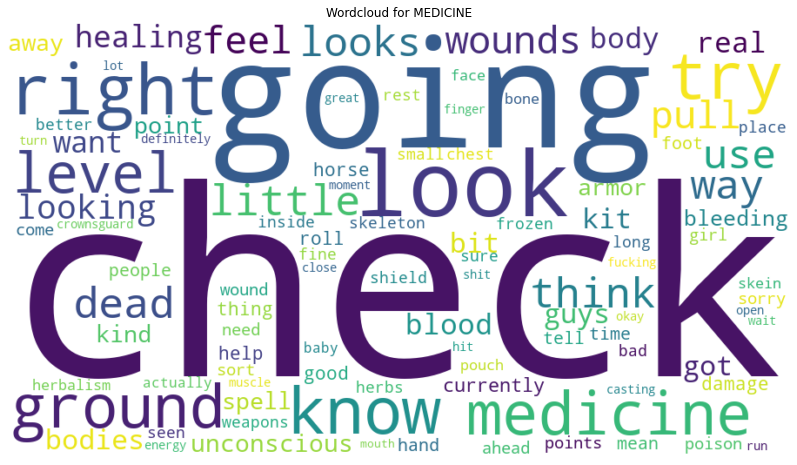

SURVIVAL


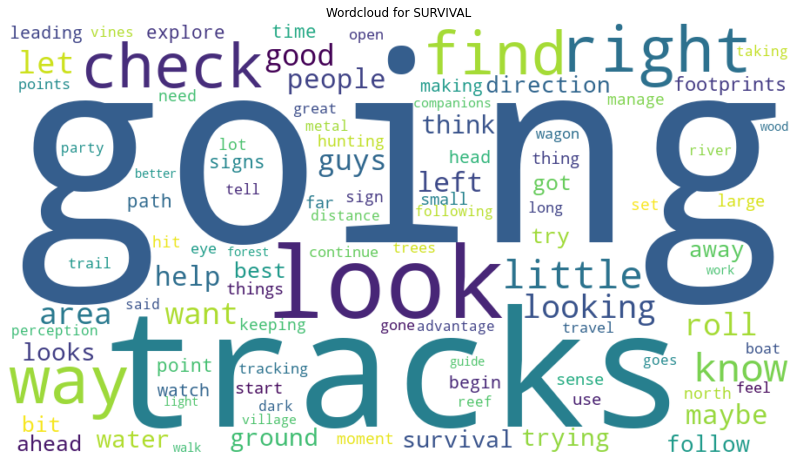

RELIGION


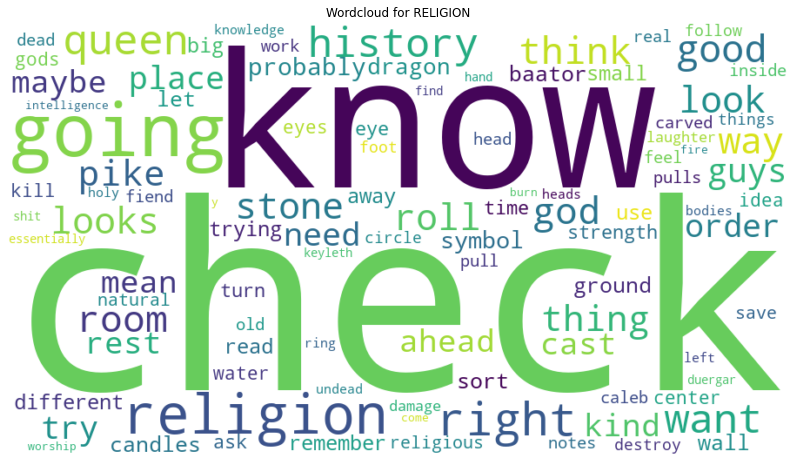

ARCANA


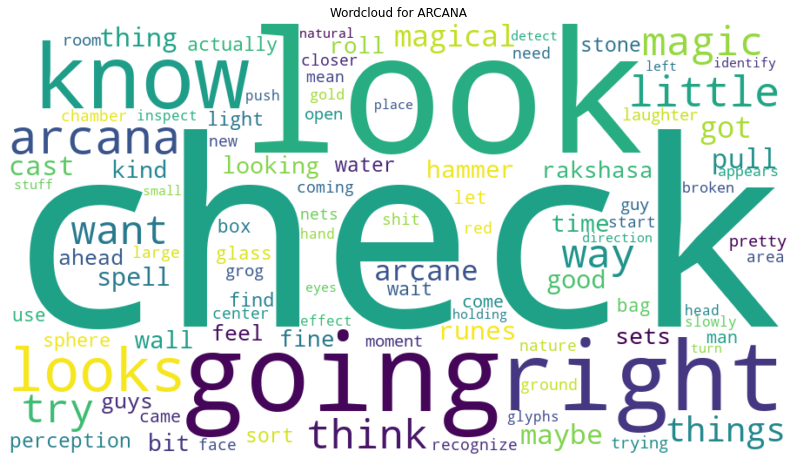

DECEPTION


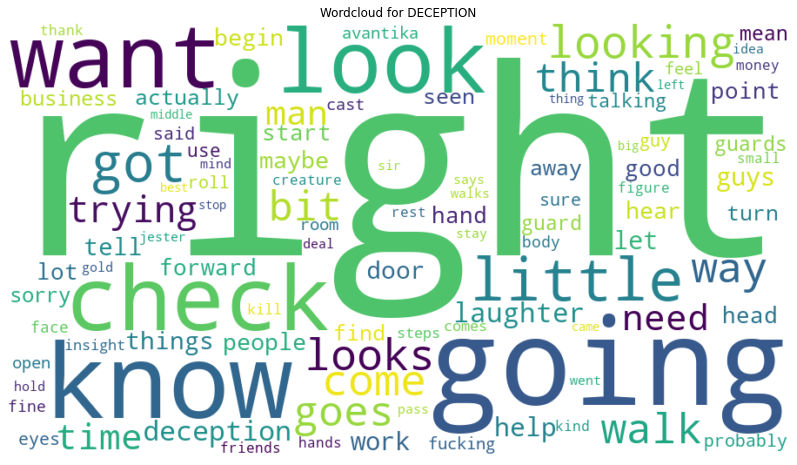

INTIMIDATION


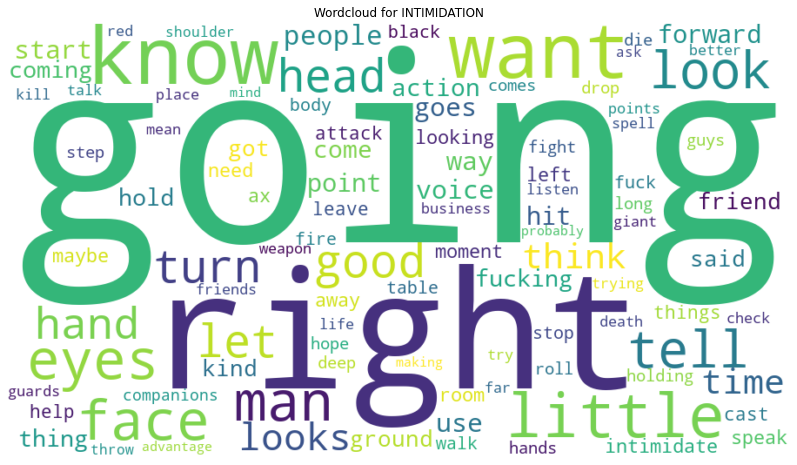

HISTORY


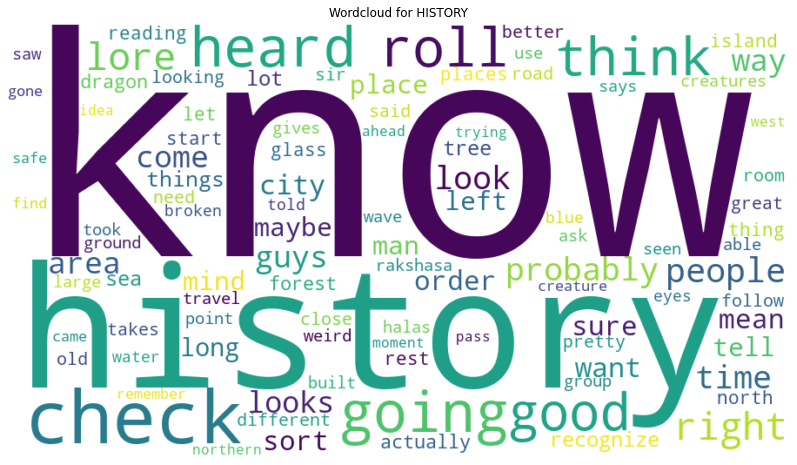

SLEIGHT OF HAND


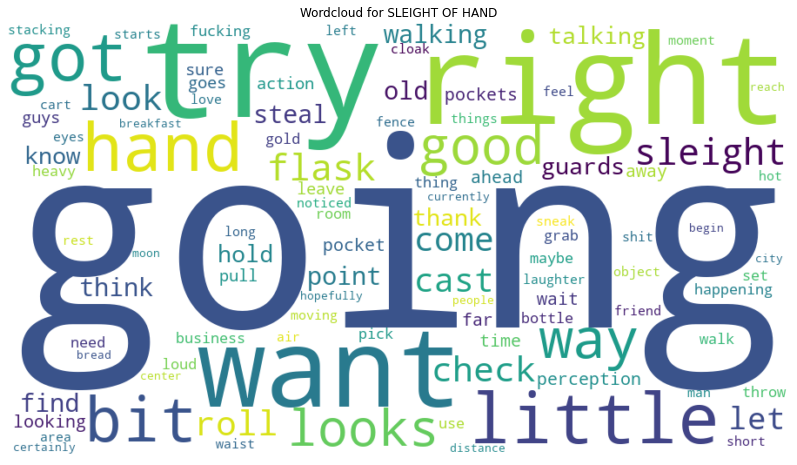

ANIMAL HANDLING


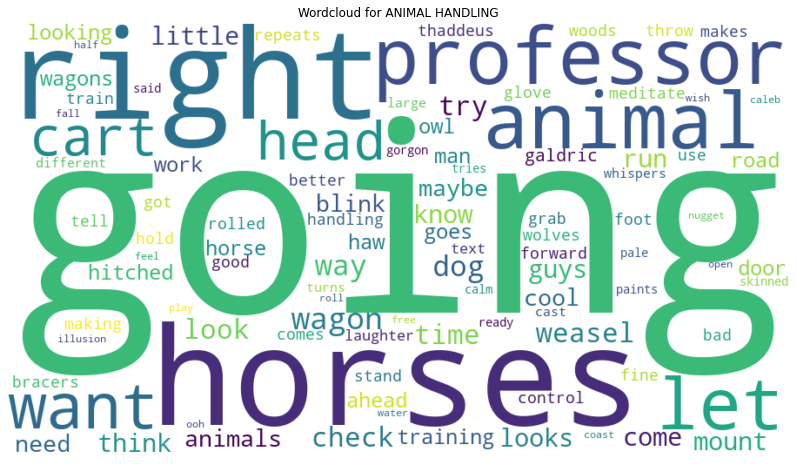

PERFORMANCE


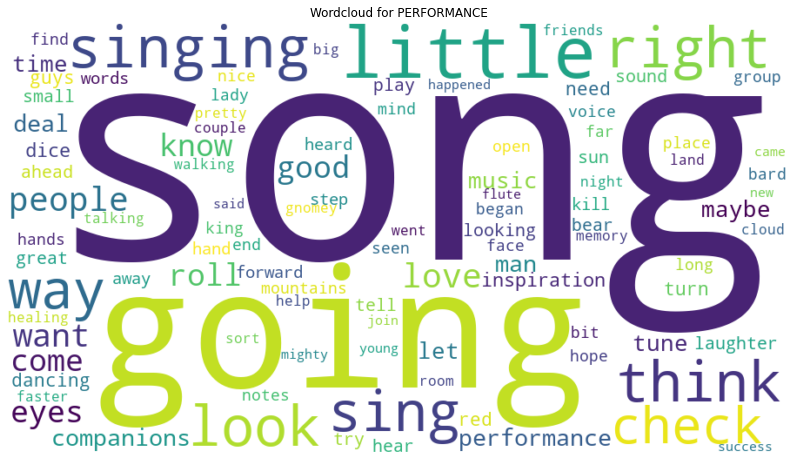

In [172]:
for label in scarse_df[TARGET_VARIABLE].unique():
    label_mask = scarse_df[TARGET_VARIABLE] == label
    partial_df = scarse_df[label_mask]
    print(label)
    plot_wordcloud(partial_df['PROCESSED_DOC'], title="Wordcloud for {}".format(label))
    plot_term_scatter(partial_df,'PROCESSED_DOC', title="Distribution of top-50 terms for {}".format(label))

#TODO

3.   Usar o steamming do Spacy, basicamente usar o radical das palavras, retirando plurais e conjugações.
5.   Com o bag of words tentar diferentes percentuais acumulados para construir as features com as palavras mais comuns para cada skill. Faz a limpeza do ruído e mantem apenas o sinal.

TO DOs
Lista de atividades pendentes para refinar o modelo e o pipeline, sem uma ordem específica:

Abrigar o código no git hub e abrir esses pontos de melhoria como issues que vamos baixando utilizando pull requests

Testar outros tipos de modelo (decision tree, random forest e NN - Neural Networks costumam ter um bom desempenho neste tipo de problema)

Ajustar a chamada da predição para trabalhar com a string com os mesmos tratamentos utilizados no treino (deve melhorar a eficiência) **criar uma função para isso** FEITO

Aumentar a quantidade de dados para treino

Separar o pipeline em scrapping (por fonte de dados), data prep (por fonte de dados), enrichment (combinação das fontes de dados), treino do modelo, escoragem e validação do modelo

Verificar uma forma mais elegante de passar / criar stopwords em grande volume no Spacy *feito*

Fazer análise de wordcloud utilizando os dados de treinamento

Fazer análise de bag of words utilizando os dados de treinamento

Fazer análise de bag of words com percentil acumulado de ocorrências (separar ruído de sinal) nas palavras que irão para o treinamento, colocar um ponto de corte

Testar modelo com menos linhas de texto do transcript, analisar se melhora o modelo.

Testar pegar apenas verbos e substantivos (POS - Part of Speech) com o Spacy, analisar se o modelo melhora FEITO 

Testar lemmatização utilizando o Spacy, analisar se o modelo melhora. *feito*

Testar iterar pela parse tree do Spacy, testar se os ngramas (combinação de palavras que aparecem juntas) melhoram o modelo. *feito*

Extração de NER (nomes de players) utilizando o Spacy *feito*

ref. https://spacy.io/usage/linguistic-features

20/01
adicionar uma coluna com o texto feito o pos e outra coluna com o pos e o stemming

In [92]:
def plot_categories_distribution(df, category_variable, id, title="Categories distribution"):
    df_categories = df.groupby(category_variable)[id].count().reset_index().rename(columns={id : 'COUNT'})

    fig = px.bar(df_categories, 
                 x=category_variable, 
                 y='COUNT', 
                 text='COUNT',
                 labels={category_variable: 'Categories',
                         'COUNT': 'Category frequency'
                 },
                 title=title
                )
    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
    fig.update_layout(xaxis_tickangle=45)
    fig.show()
    return df_categories

In [90]:
def plot_term_scatter(df, text_variable, title='Distribution of top-50 terms'):
    '''Plot the distribution of the top-50 terms present in all obs of a text variable 
    and grouping then by part-of-speech'''
    text = df[text_variable].str.cat(sep=" ")
    words = WordPunctTokenizer().tokenize(text)
    '''Selecting top 50 words'''
    top_words = pd.Series(words).value_counts().nlargest(100)
    words_df = top_words.rename_axis('words').reset_index(name='count')
    words_df['pos'] = [NLP_SPACY(word)[0].pos_ for word in words_df['words']]

    fig = px.scatter(words_df, 
                     x='words', 
                     y='count', 
                     color='pos', 
                     labels={'words':'Terms',
                             'count': 'Term Frequency',
                             'pos': 'Part-of-speech'
                            }, 
                     marginal_y='rug',
                     title=title
                    )
    fig.update_layout(xaxis_tickangle=45, xaxis_categoryorder = 'total descending')
    fig.show()
    return words_df

In [91]:
def plot_wordcloud(df_column, title="Wordcloud"):
    text = df_column.str.cat(sep=" ")
    
    wordcloud = WordCloud(
        max_words=100,
        width=900,
        height=500,
        max_font_size=350,
        collocations=False,
        normalize_plurals=False,
        background_color='white',
        prefer_horizontal=1
    ).generate(text)
   
    plt.figure(figsize=(20, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()